# Module 3 - Statistical Foundations for AI

## Objective

- Demonstrate statistical analysis, visualization, and applied examples for AI.



## Assignment 01 — Statistical Foundations


Hypothesis Testing: Parametric vs Non-Parametric Analysis Based on Data Distribution

In [ ]:
Assignment Objectives:
By completing this assignment, you will be able to:
•	Understand when to use parametric vs non-parametric tests
•	Perform distribution checks (normality tests, plots)
•	Formulate and test null and alternative hypotheses
•	Use at least one parametric and one non-parametric test appropriately
•	Interpret results clearly with visuals and reasoning
Dataset:
 Employee Attrition Dataset – Kaggle
Dataset Features (Selected)
•	Age (numeric)
•	MonthlyIncome (numeric)
•	JobSatisfaction (1–4)
•	Attrition (Yes/No)
•	JobRole (Sales Executive, Research Scientist, etc.)
Problem Statement:
You are an HR data analyst at a large firm. The leadership wants to understand whether:
•	Monthly income and age differ between employees who left vs stayed
•	Job satisfaction differs across job roles
Use statistical hypothesis testing to answer the following:

PART A — Parametric or Non-Parametric?
1.	Select two numeric variables (MonthlyIncome, Age) and one categorical grouping variable (Attrition or JobRole).
2.	Check the distribution of the numeric variables using:
•	Histogram / Boxplot
•	Shapiro-Wilk or Kolmogorov-Smirnov test
3.	Decide whether each variable is normally distributed or not.


📥 Loading dataset...

✅ Data successfully loaded.
   → Total records: 1470
   → Total features: 35

🧹 Cleaning Data...
   → No missing values found in the dataset.

📊 Descriptive Statistics for Numeric Variables:
       MonthlyIncome          Age
count    1470.000000  1470.000000
mean     6502.931293    36.923810
std      4707.956783     9.135373
min      1009.000000    18.000000
25%      2911.000000    30.000000
50%      4919.000000    36.000000
75%      8379.000000    43.000000
max     19999.000000    60.000000

🧾 Explanation:
   → We are analyzing the distribution of two numeric variables: MonthlyIncome and Age.
   → Summary statistics (count, mean, std, min, max, quartiles) are shown above.

🎯 Checking if variables follow a normal distribution.
   H₀: Data follows a normal distribution.
   H₁: Data does not follow a normal distribution.

🔍 Variable: MonthlyIncome


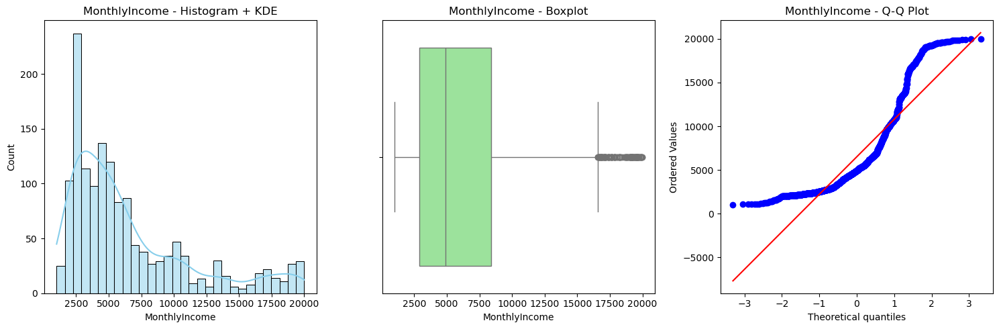

📈 Skewness: 1.37
📈 Kurtosis: 1.01

🧪 Shapiro-Wilk Test → W = 0.8279, p = 0.0000
   ❌ Interpretation: Data likely does NOT come from a normal distribution (reject H₀).
   → ❌ Reject H₀ → Not Normal

🧪 Kolmogorov-Smirnov Test → D = 0.1689, p = 0.0000
   ❌ Interpretation: Data likely does NOT come from a normal distribution (reject H₀).
   → ❌ Reject H₀ → Not Normal

📌 Final Decision: ❌ Not Normally Distributed

🔍 Variable: Age


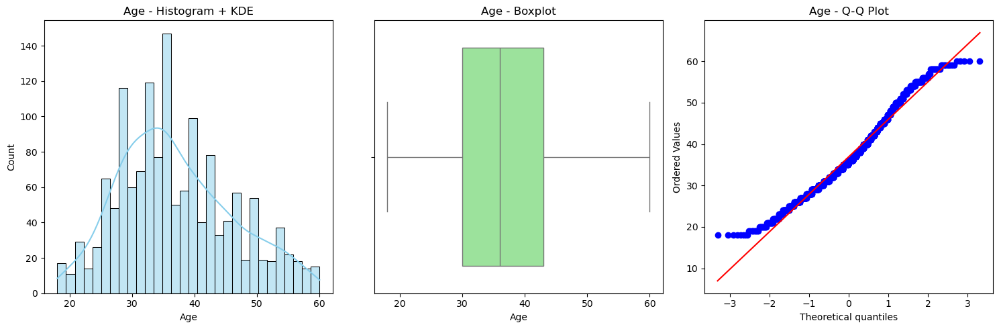

📈 Skewness: 0.41
📈 Kurtosis: -0.40

🧪 Shapiro-Wilk Test → W = 0.9774, p = 0.0000
   ❌ Interpretation: Data likely does NOT come from a normal distribution (reject H₀).
   → ❌ Reject H₀ → Not Normal

🧪 Kolmogorov-Smirnov Test → D = 0.0831, p = 0.0000
   ❌ Interpretation: Data likely does NOT come from a normal distribution (reject H₀).
   → ❌ Reject H₀ → Not Normal

📌 Final Decision: ❌ Not Normally Distributed

📊 Final Normality Summary Table:
     Variable  Skewness  Kurtosis  Shapiro p-value  KS p-value Normally Distributed?
MonthlyIncome      1.37      1.01              0.0         0.0                    No
          Age      0.41     -0.40              0.0         0.0                    No


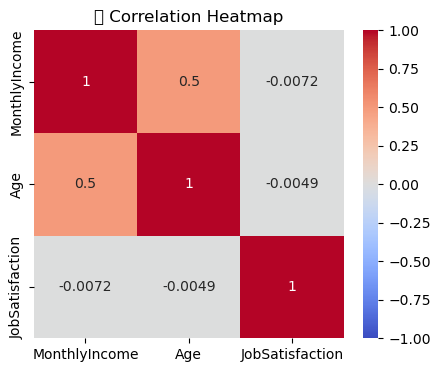


📌 Heatmap Interpretation:
 - MonthlyIncome and Age: moderate positive correlation (r = 0.50)
 - MonthlyIncome and JobSatisfaction: negligible negative correlation (r = -0.01)
 - Age and MonthlyIncome: moderate positive correlation (r = 0.50)
 - Age and JobSatisfaction: negligible negative correlation (r = -0.00)
 - JobSatisfaction and MonthlyIncome: negligible negative correlation (r = -0.01)
 - JobSatisfaction and Age: negligible negative correlation (r = -0.00)


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import shapiro, kstest
import warnings
import numpy as np

warnings.filterwarnings("ignore")

# =========================
# 📂 Step 1: Data Loading
# =========================
print("📥 Loading dataset...")

# Load dataset from CSV
file_path = "data/WA_Fn-UseC_-HR-Employee-Attrition.csv"  # Update path if needed
df = pd.read_csv(file_path)

# Explanation
print("\n✅ Data successfully loaded.")
print("   → Total records:", df.shape[0])
print("   → Total features:", df.shape[1])

# =========================
# 🧹 Step 2: Data Cleaning
# =========================
print("\n🧹 Cleaning Data...")

# Check for missing values
missing_summary = df.isnull().sum()
missing_columns = missing_summary[missing_summary > 0]

if missing_columns.empty:
    print("   → No missing values found in the dataset.")
else:
    print("   ⚠️ Missing values found in the following columns:")
    print(missing_columns)

# You could add imputation here if needed; dataset has no missing by default

# ==============================
# 📊 Step 3: Basic EDA Summary
# ==============================
numeric_vars = ['MonthlyIncome', 'Age']
print("\n📊 Descriptive Statistics for Numeric Variables:")
print(df[numeric_vars].describe())

# Explanation:
print("\n🧾 Explanation:")
print("   → We are analyzing the distribution of two numeric variables: MonthlyIncome and Age.")
print("   → Summary statistics (count, mean, std, min, max, quartiles) are shown above.")

# ===============================
# 🎯 Step 4: Normality Testing
# ===============================
print("\n🎯 Checking if variables follow a normal distribution.")
print("   H₀: Data follows a normal distribution.")
print("   H₁: Data does not follow a normal distribution.")

summary_results = []

# Loop over numeric variables
for var in numeric_vars:
    print(f"\n🔍 Variable: {var}")

    # Visual Analysis
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    sns.histplot(df[var], kde=True, bins=30, color='skyblue')
    plt.title(f'{var} - Histogram + KDE')

    plt.subplot(1, 3, 2)
    sns.boxplot(x=df[var], color='lightgreen')
    plt.title(f'{var} - Boxplot')

    plt.subplot(1, 3, 3)
    stats.probplot(df[var], dist="norm", plot=plt)
    plt.title(f'{var} - Q-Q Plot')

    plt.tight_layout()
    plt.show()

    # Numeric summaries
    skew_val = df[var].skew()
    kurt_val = df[var].kurtosis()
    print(f"📈 Skewness: {skew_val:.2f}")
    print(f"📈 Kurtosis: {kurt_val:.2f}")

    # Shapiro-Wilk Test
    shapiro_stat, shapiro_p = shapiro(df[var])
    print(f"\n🧪 Shapiro-Wilk Test → W = {shapiro_stat:.4f}, p = {shapiro_p:.4f}")
    if shapiro_p > 0.05:
        print(f"   ✅ Interpretation: Data likely comes from a normal distribution (fail to reject H₀).")
        print(f"   → ✅ Fail to Reject H₀ → Likely Normal")
    else:
        print(f"   ❌ Interpretation: Data likely does NOT come from a normal distribution (reject H₀).")
        print(f"   → ❌ Reject H₀ → Not Normal")

    # Kolmogorov-Smirnov Test
    standardized = (df[var] - df[var].mean()) / df[var].std()
    ks_stat, ks_p = kstest(standardized, 'norm')
    print(f"\n🧪 Kolmogorov-Smirnov Test → D = {ks_stat:.4f}, p = {ks_p:.4f}")
    if ks_p > 0.05:
        print(f"   ✅ Interpretation: Data likely comes from a normal distribution (fail to reject H₀).")
        print(f"   → ✅ Fail to Reject H₀ → Likely Normal")
    else:
        print(f"   ❌ Interpretation: Data likely does NOT come from a normal distribution (reject H₀).")
        print(f"   → ❌ Reject H₀ → Not Normal")

    # Final Decision
    final_decision = "✅ Normally Distributed" if shapiro_p > 0.05 and ks_p > 0.05 else "❌ Not Normally Distributed"
    print(f"\n📌 Final Decision: {final_decision}")

    # Save results
    summary_results.append({
        'Variable': var,
        'Skewness': round(skew_val, 2),
        'Kurtosis': round(kurt_val, 2),
        'Shapiro p-value': round(shapiro_p, 4),
        'KS p-value': round(ks_p, 4),
        'Normally Distributed?': "Yes" if final_decision.startswith("✅") else "No"
    })

# ============================
# 📋 Summary Table of Results
# ============================
summary_df = pd.DataFrame(summary_results)
print("\n📊 Final Normality Summary Table:")
print(summary_df.to_string(index=False))

# ========================
# 🔗 Correlation Heatmap
# ========================
plt.figure(figsize=(5, 4))
corr = df[['MonthlyIncome', 'Age', 'JobSatisfaction']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("🔗 Correlation Heatmap")
plt.show()

# Interpretation of Heatmap
print("\n📌 Heatmap Interpretation:")
for row in corr.index:
    for col in corr.columns:
        if row != col:
            r = corr.loc[row, col]
            direction = "positive" if r > 0 else "negative"
            strength = abs(r)
            if strength >= 0.7:
                desc = "strong"
            elif strength >= 0.4:
                desc = "moderate"
            elif strength >= 0.1:
                desc = "weak"
            else:
                desc = "negligible"
            print(f" - {row} and {col}: {desc} {direction} correlation (r = {r:.2f})")


PART B — Hypothesis Test (Binary Group)
Example Hypothesis:
•	H₀: There is no difference in Monthly Income between employees who left and those who stayed.
•	H₁: There is a difference in Monthly Income between the two groups.
 If normal: Use Independent Two-Sample t-test
 If not normal: Use Mann-Whitney U Test

In [3]:
from scipy.stats import ttest_ind, mannwhitneyu, shapiro
import pandas as pd

# Extract groups
group_yes = df[df['Attrition'] == 'Yes']['MonthlyIncome'].dropna()
group_no = df[df['Attrition'] == 'No']['MonthlyIncome'].dropna()

# --- Step 1: State the Hypotheses ---
print("\n🎯 Hypothesis:")
print("H₀: There is no difference in Monthly Income between employees who left and those who stayed.")
print("H₁: There is a difference in Monthly Income between the two groups.")

# --- Step 2: Check Normality of Both Groups ---
print("\n📊 Normality Check using Shapiro-Wilk Test:")
normal_yes = shapiro(group_yes)
normal_no = shapiro(group_no)

def interpret_shapiro(label, stat, p):
    verdict = "✅ Likely Normal" if p > 0.05 else "❌ Not Normal"
    print(f"  - Attrition = {label} → W = {stat:.4f}, p = {p:.4f} → {verdict}")

interpret_shapiro('Yes', *normal_yes)
interpret_shapiro('No', *normal_no)

# --- Step 3: Choose the Test Based on Normality ---
print("\n🔍 Test Selection Rationale:")
if normal_yes.pvalue > 0.05 and normal_no.pvalue > 0.05:
    print("✅ Both groups appear to be normally distributed based on p > 0.05.")
    print("→ Using **Independent Two-Sample t-test**, a parametric test suitable when both groups follow normal distribution.")
    stat, p = ttest_ind(group_yes, group_no, equal_var=False)
    test_used = "Independent t-test"
else:
    print("❌ One or both groups do not appear to be normally distributed.")
    print("→ Using **Mann-Whitney U Test**, a non-parametric test that does not assume normality.")
    stat, p = mannwhitneyu(group_yes, group_no, alternative='two-sided')
    test_used = "Mann-Whitney U Test"

# --- Step 4: Report Results ---
print(f"\n🧪 Test Used: {test_used}")
print(f"   → Test Statistic = {stat:.4f}, p-value = {p:.4f}")

# --- Step 5: Conclusion ---
print("\n📌 Final Conclusion:")
if p < 0.05:
    print("❌ Reject H₀: There IS a significant difference in Monthly Income between employees who left and those who stayed.")
else:
    print("✅ Fail to Reject H₀: There is NO significant difference in Monthly Income between the groups.")



🎯 Hypothesis:
H₀: There is no difference in Monthly Income between employees who left and those who stayed.
H₁: There is a difference in Monthly Income between the two groups.

📊 Normality Check using Shapiro-Wilk Test:
  - Attrition = Yes → W = 0.7799, p = 0.0000 → ❌ Not Normal
  - Attrition = No → W = 0.8341, p = 0.0000 → ❌ Not Normal

🔍 Test Selection Rationale:
❌ One or both groups do not appear to be normally distributed.
→ Using **Mann-Whitney U Test**, a non-parametric test that does not assume normality.

🧪 Test Used: Mann-Whitney U Test
   → Test Statistic = 100620.5000, p-value = 0.0000

📌 Final Conclusion:
❌ Reject H₀: There IS a significant difference in Monthly Income between employees who left and those who stayed.


PART C — Hypothesis Test (Multiple Groups)
Example Hypothesis:
•	H₀: The median job satisfaction is the same across all job roles.
•	H₁: At least one job role differs in median job satisfaction.
 If normal: Use One-way ANOVA
 If not normal: Use Kruskal-Wallis Test

In [4]:
from scipy.stats import shapiro, kruskal, f_oneway
import pandas as pd

# Assuming df is already loaded and cleaned
job_roles = df['JobRole'].unique()
group_data = {role: df[df['JobRole'] == role]['JobSatisfaction'] for role in job_roles}

# 1. Check normality within each job role
normality_results = {}
print("📊 Normality Check per Job Role (Shapiro-Wilk):")
for role, scores in group_data.items():
    stat, p = shapiro(scores)
    is_normal = p > 0.05
    symbol = "✅" if is_normal else "❌"
    normality_results[role] = is_normal
    print(f"  - {role}: W = {stat:.4f}, p = {p:.4f} → {symbol} {'Likely Normal' if is_normal else 'Not Normal'}")

# 2. Choose appropriate test
if all(normality_results.values()):
    print("\n✅ All groups passed normality → Using One-way ANOVA")
    test_name = "One-way ANOVA"
    stat, p = f_oneway(*(scores for scores in group_data.values()))
else:
    print("\n❌ Not all groups are normally distributed → Using Kruskal-Wallis Test")
    test_name = "Kruskal-Wallis Test"
    stat, p = kruskal(*(scores for scores in group_data.values()))

# 3. Report results
print(f"\n🧪 Test Used: {test_name}")
print(f"   → Test Statistic = {stat:.4f}, p-value = {p:.4f}")

if p < 0.05:
    print("❌ Reject H₀: There is a significant difference in Job Satisfaction across Job Roles.")
else:
    print("✅ Fail to Reject H₀: No significant difference in Job Satisfaction across Job Roles.")


📊 Normality Check per Job Role (Shapiro-Wilk):
  - Sales Executive: W = 0.8303, p = 0.0000 → ❌ Not Normal
  - Research Scientist: W = 0.8417, p = 0.0000 → ❌ Not Normal
  - Laboratory Technician: W = 0.8427, p = 0.0000 → ❌ Not Normal
  - Manufacturing Director: W = 0.8622, p = 0.0000 → ❌ Not Normal
  - Healthcare Representative: W = 0.8313, p = 0.0000 → ❌ Not Normal
  - Manager: W = 0.8426, p = 0.0000 → ❌ Not Normal
  - Sales Representative: W = 0.8657, p = 0.0000 → ❌ Not Normal
  - Research Director: W = 0.8560, p = 0.0000 → ❌ Not Normal
  - Human Resources: W = 0.8670, p = 0.0000 → ❌ Not Normal

❌ Not all groups are normally distributed → Using Kruskal-Wallis Test

🧪 Test Used: Kruskal-Wallis Test
   → Test Statistic = 3.4506, p-value = 0.9030
✅ Fail to Reject H₀: No significant difference in Job Satisfaction across Job Roles.


Bonus Challenge (Optional)
 Compare Age across JobRoles using both parametric and non-parametric tests, and explain:
Which test is more appropriate and why?

🔍 Unique Job Roles: 9
📊 Sample Data:
                  JobRole  Age
0        Sales Executive   41
1     Research Scientist   49
2  Laboratory Technician   37
3     Research Scientist   33
4  Laboratory Technician   27

🧪 Shapiro-Wilk Normality Test per JobRole:
  - Sales Executive           → W = 0.9490, p = 0.0000 → ❌ Not Normal
  - Research Scientist        → W = 0.9578, p = 0.0000 → ❌ Not Normal
  - Laboratory Technician     → W = 0.9752, p = 0.0002 → ❌ Not Normal
  - Manufacturing Director    → W = 0.9611, p = 0.0004 → ❌ Not Normal
  - Healthcare Representative → W = 0.9670, p = 0.0028 → ❌ Not Normal
  - Manager                   → W = 0.9754, p = 0.0534 → ✅ Likely Normal
  - Sales Representative      → W = 0.9404, p = 0.0008 → ❌ Not Normal
  - Research Director         → W = 0.9695, p = 0.0526 → ✅ Likely Normal
  - Human Resources           → W = 0.9738, p = 0.3046 → ✅ Likely Normal

❌ Not all job roles are normally distributed → Kruskal-Wallis is more appropriate.

📊 Parametric T

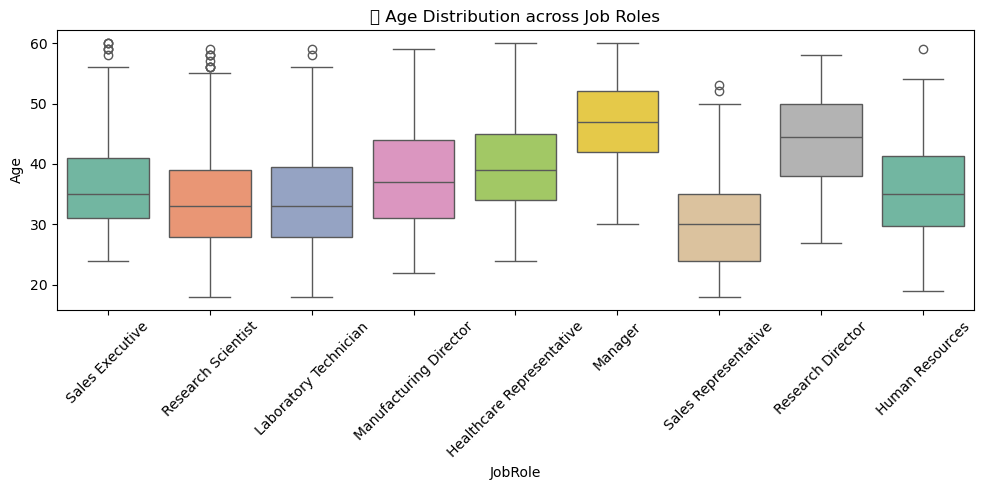

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, f_oneway, kruskal


# Filter relevant columns
df = df[['Age', 'JobRole']]

# Preview
print("🔍 Unique Job Roles:", df['JobRole'].nunique())
print("📊 Sample Data:\n", df[['JobRole', 'Age']].head())

# Check group-wise normality using Shapiro-Wilk test
normality_results = {}
print("\n🧪 Shapiro-Wilk Normality Test per JobRole:")
for role in df['JobRole'].unique():
    age_data = df[df['JobRole'] == role]['Age']
    stat, p = shapiro(age_data)
    normality_results[role] = p > 0.05
    status = "✅ Likely Normal" if p > 0.05 else "❌ Not Normal"
    print(f"  - {role:25s} → W = {stat:.4f}, p = {p:.4f} → {status}")

# Decide which test is more appropriate
all_normal = all(normality_results.values())
if all_normal:
    print("\n✅ All job roles passed normality → One-way ANOVA is appropriate.")
else:
    print("\n❌ Not all job roles are normally distributed → Kruskal-Wallis is more appropriate.")

# Prepare data for testing
groups = [df[df['JobRole'] == role]['Age'] for role in df['JobRole'].unique()]

# Run both tests for comparison
print("\n📊 Parametric Test → One-way ANOVA")
anova_stat, anova_p = f_oneway(*groups)
print(f"   F-statistic = {anova_stat:.4f}, p-value = {anova_p:.4f}")
if anova_p < 0.05:
    print("   ❌ Reject H₀: Significant difference in Age across JobRoles (ANOVA)")
else:
    print("   ✅ Fail to Reject H₀: No significant difference in Age (ANOVA)")

print("\n📊 Non-Parametric Test → Kruskal-Wallis")
kw_stat, kw_p = kruskal(*groups)
print(f"   H-statistic = {kw_stat:.4f}, p-value = {kw_p:.4f}")
if kw_p < 0.05:
    print("   ❌ Reject H₀: Significant difference in Age across JobRoles (Kruskal-Wallis)")
else:
    print("   ✅ Fail to Reject H₀: No significant difference in Age (Kruskal-Wallis)")

# Final Recommendation
print("\n📌 Final Recommendation:")
if all_normal and anova_p < 0.05:
    print("✅ One-way ANOVA is statistically appropriate and shows significant difference.")
elif not all_normal and kw_p < 0.05:
    print("✅ Kruskal-Wallis is more appropriate due to non-normality and it shows significance.")
elif not all_normal:
    print("🔎 Although ANOVA was performed, Kruskal-Wallis is preferred because not all groups are normal.")
else:
    print("🟰 Both tests suggest no significant difference. Use Kruskal-Wallis if assumptions are violated.")

# Optional: Boxplot visualization
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='JobRole', y='Age', palette='Set2')
plt.xticks(rotation=45)
plt.title("🎨 Age Distribution across Job Roles")
plt.tight_layout()
plt.show()


## Visualization exercises


In [9]:
import pandas as pd
file_path = "data/netflix_titles.csv"  # Update path if needed
df = pd.read_csv(file_path)
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [10]:
df.describe(include="all")

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,8807,8807,8807,6173,7982,7976,8797,8807.000000,8803,8804,8807,8807
unique,8807,2,8807,4528,7692,748,1767,NaN,17,220,514,8775
top,s1,Movie,Dick Johnson Is Dead,Rajiv Chilaka,David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,"Dramas, International Movies","Paranormal activity at a lush, abandoned prope..."
freq,1,6131,1,19,19,2818,109,NaN,3207,1793,362,4
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014.180198,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.819312,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019.000000,NaN,NaN,NaN,NaN


In [12]:
import pandas as pd

# Function to convert duration to minutes
def convert_to_minutes(duration, type_):
    if pd.isna(duration):
        return None
    try:
        # Remove leading/trailing whitespace
        duration = duration.strip()

        if 'min' in duration:
            # Movie duration (e.g., "90 min")
            return int(duration.replace('min', '').strip())
        elif 'Season' in duration:
            # TV show duration (e.g., "2 Seasons" or "1 Season")
            num_seasons = int(duration.replace('Seasons', '').replace('Season', '').strip())
            # Assume 10 episodes per season, 45 minutes per episode
            return num_seasons * 10 * 45
        else:
            return None
    except (ValueError, AttributeError):
        return None

# Create new column 'duration_in_minutes'
df['duration_in_minutes'] = df.apply(lambda row: convert_to_minutes(row['duration'], row['type']), axis=1)

# Display the first few rows to verify
df[['title', 'type', 'duration', 'duration_in_minutes']].head(10)

,title,type,duration,duration_in_minutes
0,Dick Johnson Is Dead,Movie,90 min,90.0
1,Blood & Water,TV Show,2 Seasons,900.0
2,Ganglands,TV Show,1 Season,450.0
3,Jailbirds New Orleans,TV Show,1 Season,450.0
4,Kota Factory,TV Show,2 Seasons,900.0
5,Midnight Mass,TV Show,1 Season,450.0
6,My Little Pony: A New Generation,Movie,91 min,91.0
7,Sankofa,Movie,125 min,125.0
8,The Great British Baking Show,TV Show,9 Seasons,4050.0
9,The Starling,Movie,104 min,104.0


In [13]:
df.shape

(8807, 13)

In [14]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,duration_in_minutes
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",90.0
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",900.0
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,450.0
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",450.0
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,900.0


In [15]:
df.describe(include="all")

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,duration_in_minutes
count,8807,8807,8807,6173,7982,7976,8797,8807.000000,8803,8804,8807,8807,8804.000000
unique,8807,2,8807,4528,7692,748,1767,NaN,17,220,514,8775,NaN
top,s1,Movie,Dick Johnson Is Dead,Rajiv Chilaka,David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,"Dramas, International Movies","Paranormal activity at a lush, abandoned prope...",NaN
freq,1,6131,1,19,19,2818,109,NaN,3207,1793,362,4,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014.180198,NaN,NaN,NaN,NaN,310.717742
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.819312,NaN,NaN,NaN,NaN,506.761336
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN,3.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN,92.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN,112.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019.000000,NaN,NaN,NaN,NaN,450.000000


In [16]:
df.describe()

,release_year,duration_in_minutes
count,8807.000000,8804.000000
mean,2014.180198,310.717742
std,8.819312,506.761336
min,1925.000000,3.000000
25%,2013.000000,92.000000
50%,2017.000000,112.000000
75%,2019.000000,450.000000
max,2021.000000,7650.000000


<Axes: >

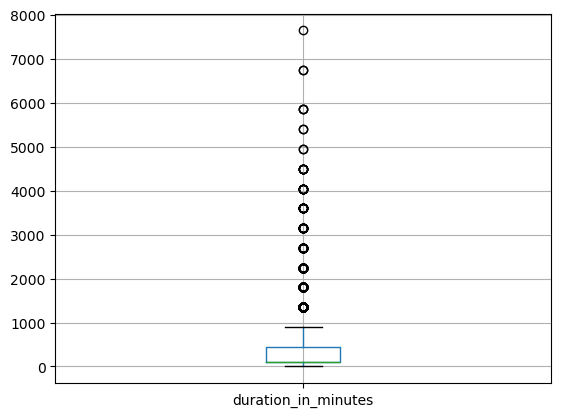

In [17]:
df.boxplot(column=["duration_in_minutes"])

In [19]:
df.drop_duplicates(inplace=True)

In [20]:
df.shape

(8807, 13)

In [21]:
df.isnull().sum()

show_id                   0
type                      0
title                     0
director               2634
cast                    825
country                 831
date_added               10
release_year              0
rating                    4
duration                  3
listed_in                 0
description               0
duration_in_minutes       3
dtype: int64

In [22]:
#mode of rating
df['rating'].fillna(df['rating'].mode()[0], inplace=True)

In [23]:
df.isnull().sum()

show_id                   0
type                      0
title                     0
director               2634
cast                    825
country                 831
date_added               10
release_year              0
rating                    0
duration                  3
listed_in                 0
description               0
duration_in_minutes       3
dtype: int64

In [24]:
#make null value of director as unknown
df['director'].fillna('Unknown', inplace=True)

In [25]:
df.isnull().sum()

show_id                  0
type                     0
title                    0
director                 0
cast                   825
country                831
date_added              10
release_year             0
rating                   0
duration                 3
listed_in                0
description              0
duration_in_minutes      3
dtype: int64

In [26]:
df.describe()

,release_year,duration_in_minutes
count,8807.000000,8804.000000
mean,2014.180198,310.717742
std,8.819312,506.761336
min,1925.000000,3.000000
25%,2013.000000,92.000000
50%,2017.000000,112.000000
75%,2019.000000,450.000000
max,2021.000000,7650.000000


In [28]:
df = pd.read_csv("data/StudentsPerformance.csv")
df.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


<Axes: >

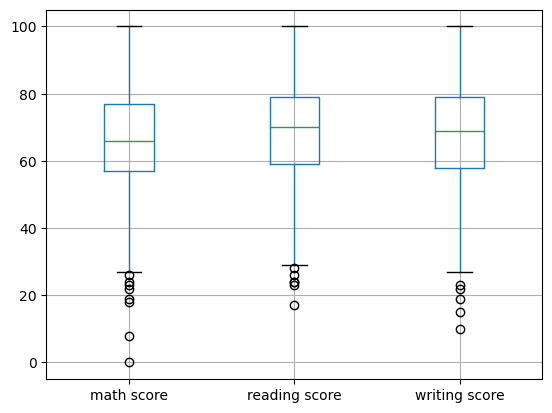

In [29]:
df.boxplot(column=["math score","reading score","writing score"])

In [30]:
from pandasql import sqldf

In [32]:
!pip install pandasql

In [34]:
df = pd.read_csv("data/ds_salaries.csv")
df.head()

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L


<Axes: >

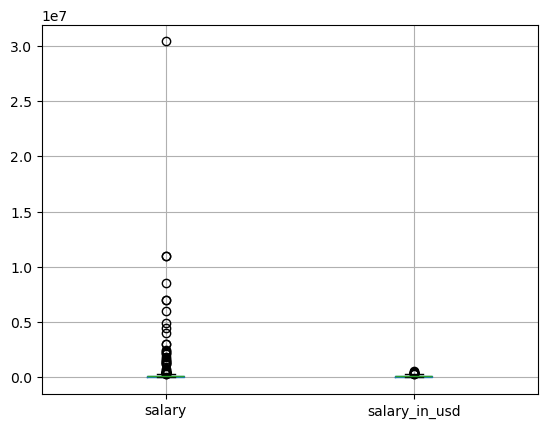

In [35]:
df.boxplot(column=["salary","salary_in_usd"])

In [36]:
df.shape

(607, 12)

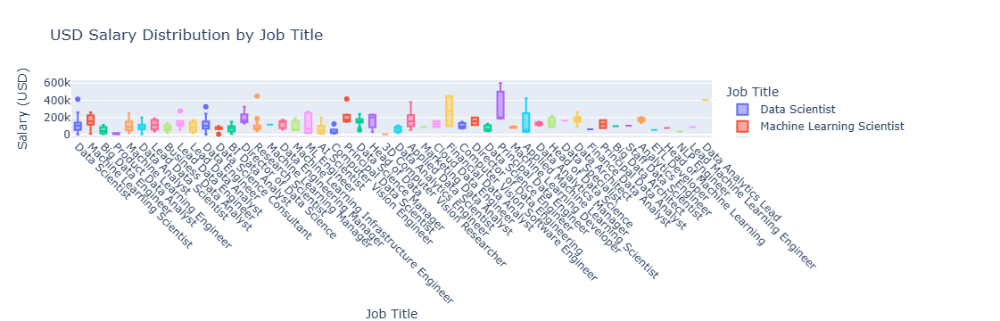

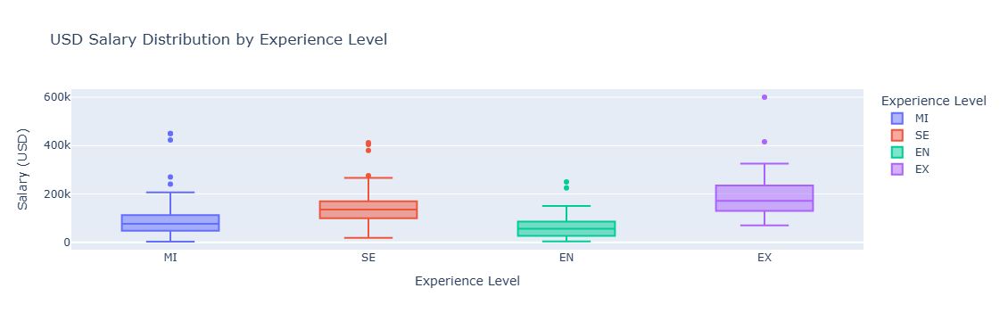

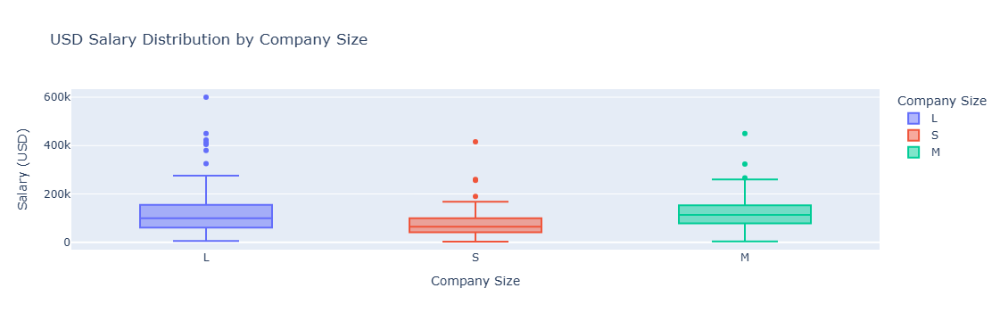

In [37]:
import pandas as pd
import plotly.express as px


# Convert salary column to numeric if not already
df['salary_in_usd'] = pd.to_numeric(df['salary_in_usd'], errors='coerce')

# Drop missing values in relevant columns
df = df.dropna(subset=['salary_in_usd', 'job_title', 'experience_level', 'company_size'])




fig1 = px.box(df,
              x='job_title',
              y='salary_in_usd',
              title='USD Salary Distribution by Job Title',
              labels={'job_title': 'Job Title', 'salary_in_usd': 'Salary (USD)'},
              color='job_title')
fig1.update_layout(xaxis_tickangle=45)
fig1.show()

#Boxplot by Experience Level
fig2 = px.box(df,
              x='experience_level',
              y='salary_in_usd',
              title='USD Salary Distribution by Experience Level',
              labels={'experience_level': 'Experience Level', 'salary_in_usd': 'Salary (USD)'},
              color='experience_level')
fig2.show()

#Boxplot by Company Size
fig3 = px.box(df,
              x='company_size',
              y='salary_in_usd',
              title='USD Salary Distribution by Company Size',
              labels={'company_size': 'Company Size', 'salary_in_usd': 'Salary (USD)'},
              color='company_size')
fig3.show()


In [38]:
df['job_title'].nunique()

50

In [41]:
df = pd.read_csv("data/Titanic-Dataset.csv")
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


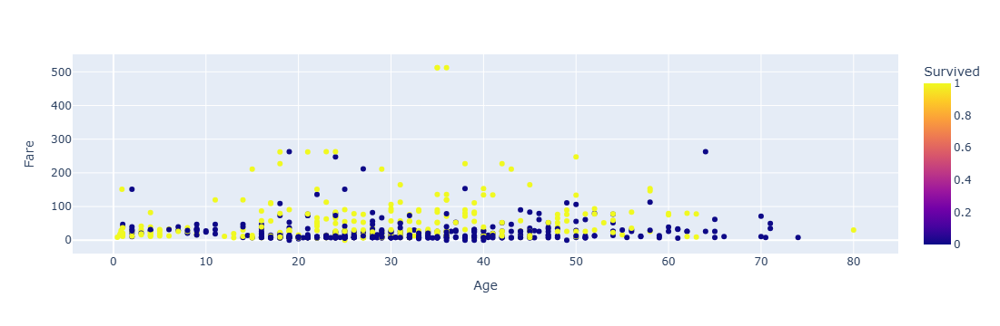

In [42]:
#scatterplot of age and fare colur by survival
px.scatter(df, x='Age', y='Fare', color='Survived')

<Axes: >

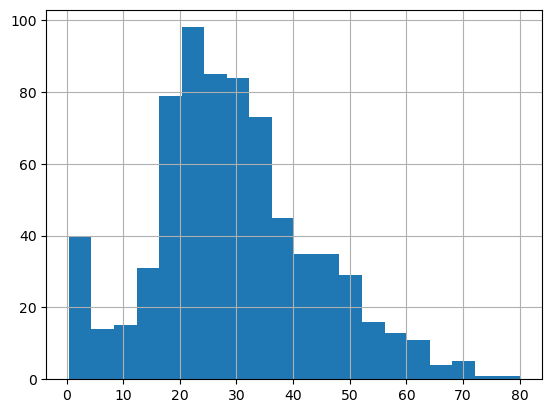

In [43]:
#histogram of Age
df['Age'].hist(bins = 20)

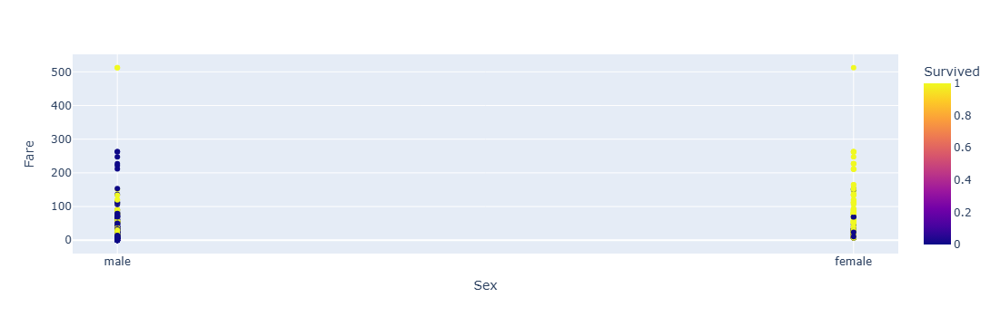

In [44]:
px.scatter(df, x='Sex', y='Fare', color='Survived')

In [45]:
df = pd.read_csv("data/AirQualityUCI.csv",sep = ";",decimal=',')
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN


In [46]:
df['CO(GT)'].isnull().sum()

114

In [47]:
df.shape

(9471, 17)

In [48]:
df.isnull().sum()

Date              114
Time              114
CO(GT)            114
PT08.S1(CO)       114
NMHC(GT)          114
C6H6(GT)          114
PT08.S2(NMHC)     114
NOx(GT)           114
PT08.S3(NOx)      114
NO2(GT)           114
PT08.S4(NO2)      114
PT08.S5(O3)       114
T                 114
RH                114
AH                114
Unnamed: 15      9471
Unnamed: 16      9471
dtype: int64

In [49]:
df['Date'].nunique()

391

In [50]:
df.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,0.0,0.0
mean,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604,NaN,NaN
std,77.657170,329.832710,139.789093,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670,NaN,NaN
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,NaN,NaN
25%,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300,NaN,NaN
50%,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.600000,0.976800,NaN,NaN
75%,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200,NaN,NaN
max,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,NaN,NaN


In [51]:
# Calculate the mean of 'CO(GT)' column, excluding NaN [before]
mean_co = df['CO(GT)'].mean()

print(f"Mean of CO(GT): {mean_co}")

Mean of CO(GT): -34.207523778989


In [52]:
# Apply linear interpolation on 'CO(GT)' column
df['CO(GT)'] = df['CO(GT)'].interpolate(method='linear')

# Check if any NaNs remain and view the filled column
print(f"Missing values after interpolation: {df['CO(GT)'].isnull().sum()}")
print(df['CO(GT)'])  # View first 10 rows of interpolated column

Missing values after interpolation: 0
0       2.6
1       2.0
2       2.2
3       2.2
4       1.6
       ... 
9466    2.2
9467    2.2
9468    2.2
9469    2.2
9470    2.2
Name: CO(GT), Length: 9471, dtype: float64


In [53]:
# Calculate the mean of 'CO(GT)' column, excluding NaN [after]
mean_co = df['CO(GT)'].mean()

print(f"Mean of CO(GT): {mean_co}")


Mean of CO(GT): -33.769295744905506


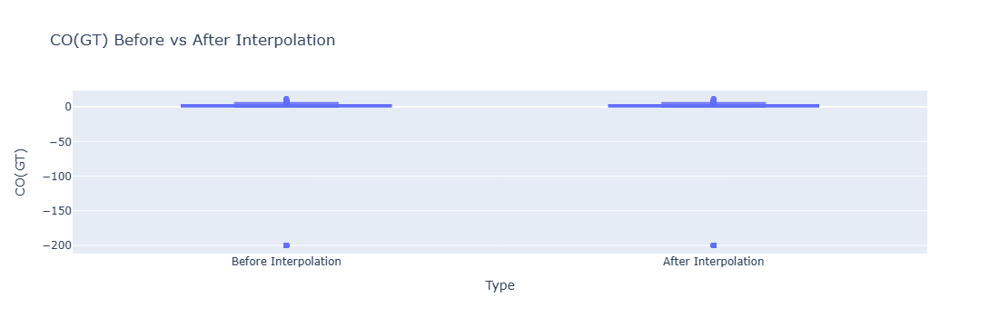

In [54]:
co_original = df['CO(GT)'].copy()

# Step 3: Apply linear interpolation
df['CO(GT)'] = df['CO(GT)'].interpolate(method='linear')

# Step 4: Prepare data for box plot
box_data = pd.DataFrame({
    'CO(GT)': pd.concat([co_original, df['CO(GT)']]),
    'Type': ['Before Interpolation'] * len(co_original) + ['After Interpolation'] * len(df['CO(GT)'])
})
# Drop NaN values (boxplot needs valid numbers)
box_data = box_data.dropna()

# Step 5: Plot box plot using Plotly
fig = px.box(box_data, x='Type', y='CO(GT)', title='CO(GT) Before vs After Interpolation')
fig.show()

In [55]:
df = pd.read_csv("data/AmesHousing.csv")
df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [54]:
#lot area , saleprice , garage area, gr liv area , year built

In [56]:
df['Lot Area'].isnull().sum()

0

In [57]:
df['Lot Area']

0       31770
1       11622
2       14267
3       11160
4       13830
        ...  
2925     7937
2926     8885
2927    10441
2928    10010
2929     9627
Name: Lot Area, Length: 2930, dtype: int64

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

In [59]:
df.isnull().sum()[:50]

Order                 0
PID                   0
MS SubClass           0
MS Zoning             0
Lot Frontage        490
Lot Area              0
Street                0
Alley              2732
Lot Shape             0
Land Contour          0
Utilities             0
Lot Config            0
Land Slope            0
Neighborhood          0
Condition 1           0
Condition 2           0
Bldg Type             0
House Style           0
Overall Qual          0
Overall Cond          0
Year Built            0
Year Remod/Add        0
Roof Style            0
Roof Matl             0
Exterior 1st          0
Exterior 2nd          0
Mas Vnr Type       1775
Mas Vnr Area         23
Exter Qual            0
Exter Cond            0
Foundation            0
Bsmt Qual            80
Bsmt Cond            80
Bsmt Exposure        83
BsmtFin Type 1       80
BsmtFin SF 1          1
BsmtFin Type 2       81
BsmtFin SF 2          1
Bsmt Unf SF           1
Total Bsmt SF         1
Heating               0
Heating QC      

In [60]:
df.shape

(2930, 82)

In [61]:
cols = ['Lot Area', 'SalePrice', 'Garage Area', 'Gr Liv Area', 'Year Built']
missing = df[cols].isnull().sum()
print("Missing values:\n", missing)

Missing values:
 Lot Area       0
SalePrice      0
Garage Area    1
Gr Liv Area    0
Year Built     0
dtype: int64


In [62]:
#fill null values in Garage Area with median
df.fillna(df['Garage Area'].median(), inplace=True)

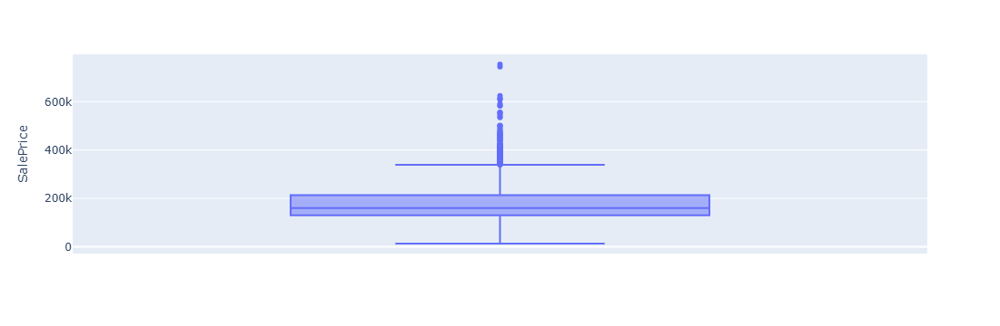

In [63]:
#box plot for sale price color them based on year built
fig = px.box(df, y='SalePrice')
fig.show()

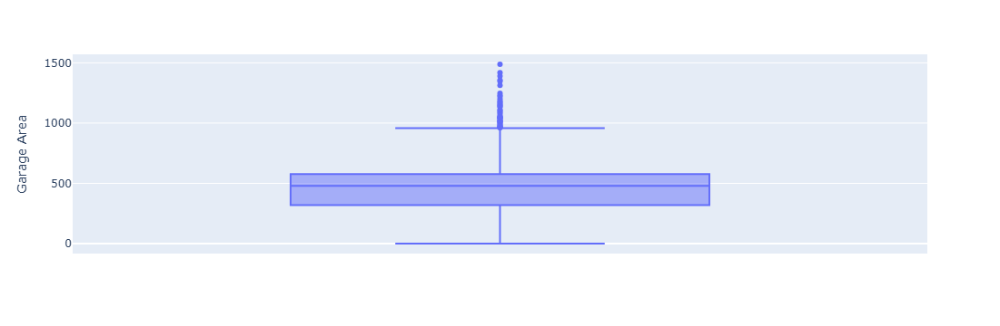

In [64]:
fig = px.box(df, y='Garage Area')
fig.show()

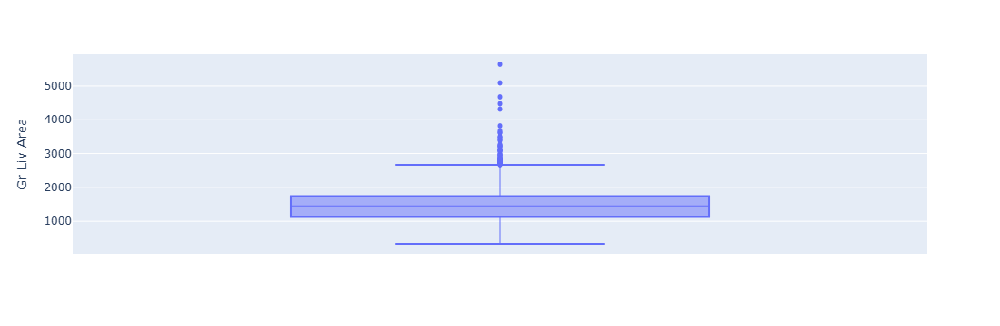

In [65]:
fig = px.box(df, y='Gr Liv Area')
fig.show()

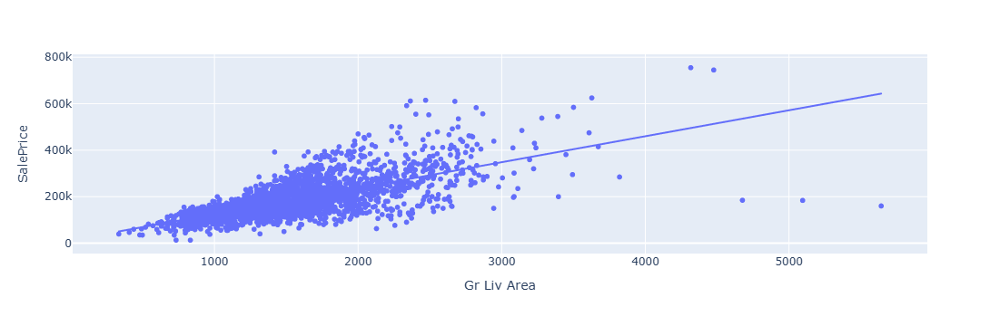

In [66]:
#Plot Gr Liv area vs sale price , repeat for garage area vs sale price , add trend line in both
fig = px.scatter(df, x='Gr Liv Area', y='SalePrice', trendline='ols')
fig.show()

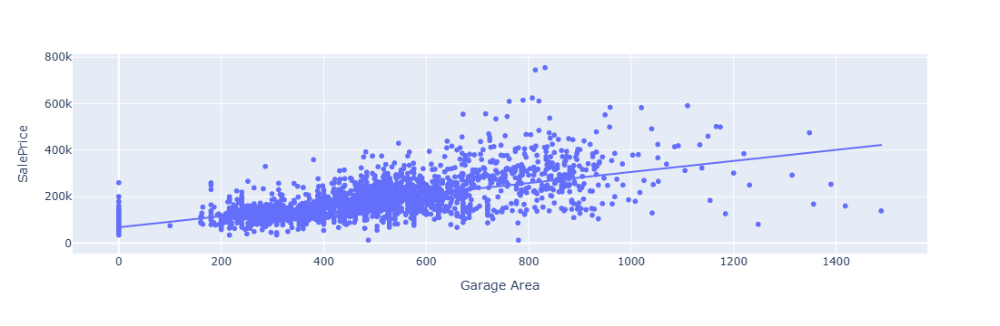

In [67]:
fig = px.scatter(df, x='Garage Area', y='SalePrice', trendline='ols')
fig.show()

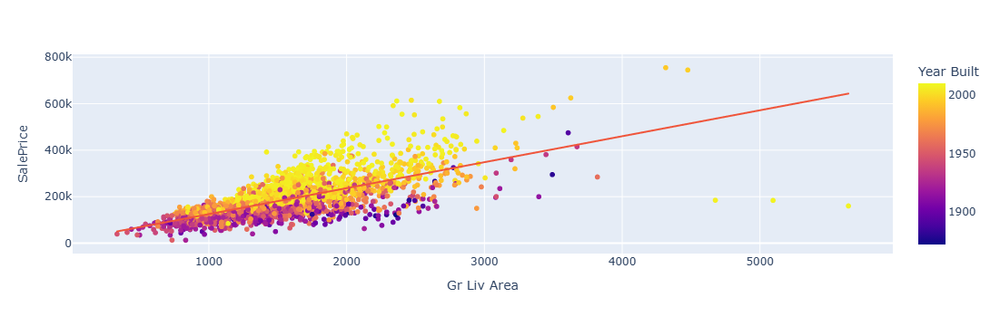

In [68]:
fig = px.scatter(df, x='Gr Liv Area', y='SalePrice', trendline='ols',color='Year Built')
fig.show()

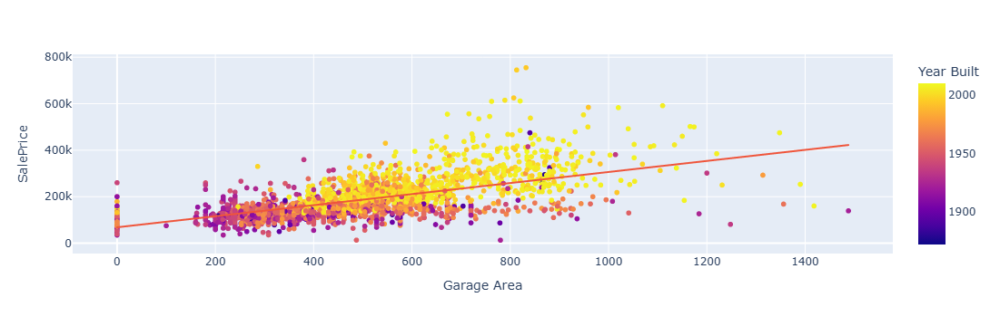

In [69]:
fig = px.scatter(df, x='Garage Area', y='SalePrice', trendline='ols',color = 'Year Built')
fig.show()

In [70]:
#bmi vs medical charges
df = pd.read_csv("data/insurance.csv")
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [71]:
df.isnull().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64

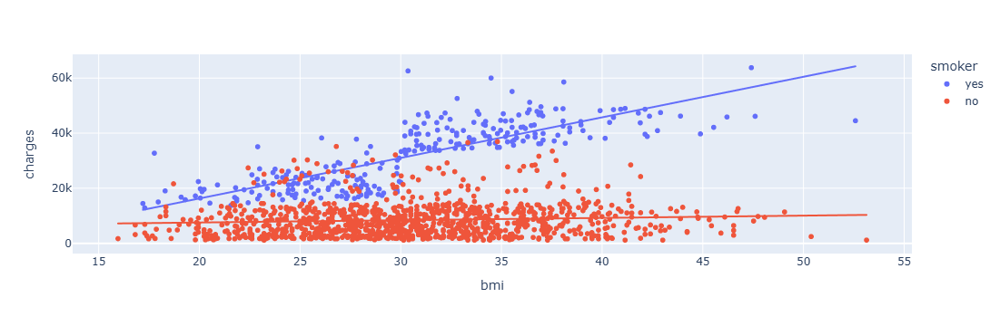

In [72]:
fig = px.scatter(df, x='bmi', y='charges', trendline='ols',color = 'smoker')
fig.show()

In [73]:
df.shape

(1338, 7)

In [74]:
import plotly.express as px
import pandas as pd

In [75]:
df.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


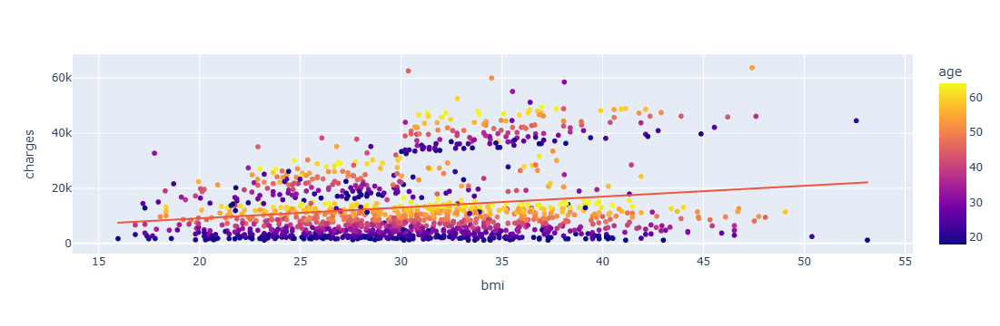

In [76]:
fig = px.scatter(df, x='bmi', y='charges', trendline='ols',color = 'age')
fig.show()

## Day 2 — Analysis


In [77]:
import pandas as pd
df = pd.read_csv("data/StudentsPerformance.csv")
df.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


#Calculate the probability that a randomly selected student scored more than 80 in math.

In [79]:
students_above_80_math = df[df['math score'] > 80].shape[0]

# Calculate the total number of students
total_students = df.shape[0]

# Calculate the probability
probability = students_above_80_math / total_students

print(f"The probability that a randomly selected student scored more than 80 in math is: {probability:.4f}")

The probability that a randomly selected student scored more than 80 in math is: 0.1760


In [80]:
import pandas as pd
df = pd.read_csv("data/insurance.csv")
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


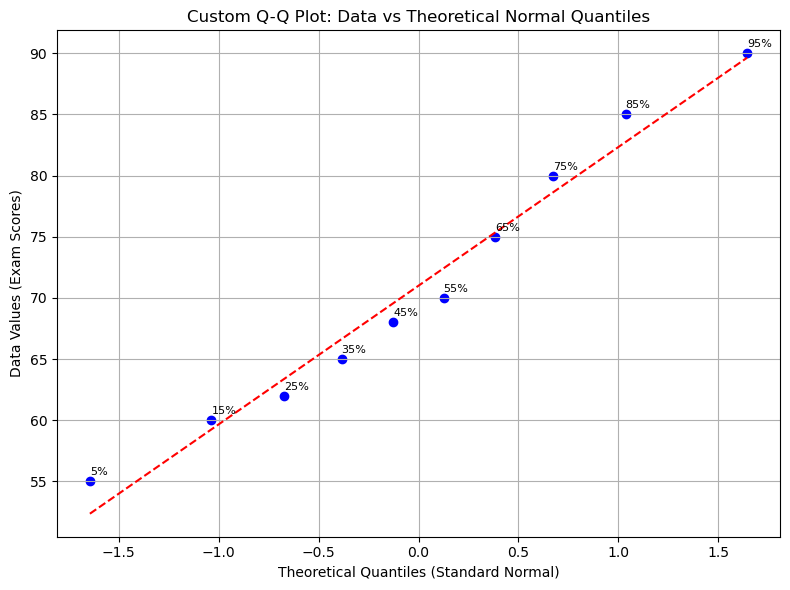

In [81]:
# Q-Q Plot Worked Example: Custom Data vs Theoretical Normal Quantiles

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# ----------------------------
# 1. Your dataset
# ----------------------------
data = np.array([55, 60, 62, 65, 68, 70, 75, 80, 85, 90])
n = len(data)

# ----------------------------
# 2. Calculate percentiles for each data point
# Formula: (i - 0.5) / n
# ----------------------------
percentiles = [(i - 0.5) / n for i in range(1, n+1)]

# ----------------------------
# 3. Calculate theoretical normal quantiles using inverse CDF (ppf)
# ----------------------------
expected_normal = [norm.ppf(p) for p in percentiles]

# ----------------------------
# 4. Plotting
# ----------------------------
plt.figure(figsize=(8,6))
plt.scatter(expected_normal, data, color='blue')
plt.title('Custom Q-Q Plot: Data vs Theoretical Normal Quantiles')
plt.xlabel('Theoretical Quantiles (Standard Normal)')
plt.ylabel('Data Values (Exam Scores)')

# Add a best fit line for reference
slope, intercept = np.polyfit(expected_normal, data, 1)
plt.plot(expected_normal, np.array(expected_normal)*slope + intercept, color='red', linestyle='--')

# Annotate each point with its percentile for teaching
for x, y, p in zip(expected_normal, data, percentiles):
    plt.text(x, y+0.5, f"{int(p*100)}%", fontsize=8)

plt.grid(True)
plt.tight_layout()
plt.show()

In [82]:
#draw a qq plot for math score in the dataframe df
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Get the math scores and sort them
math_scores = np.sort(df['math score'])
n = len(math_scores)

# Calculate percentiles for each data point
percentiles = [(i - 0.5) / n for i in range(1, n+1)]

# Calculate theoretical normal quantiles using inverse CDF (ppf)
expected_normal = [norm.ppf(p) for p in percentiles]

# Plotting
plt.figure(figsize=(8,6))
plt.scatter(expected_normal, math_scores, color='blue')
plt.title('Q-Q Plot: Math Score vs Theoretical Normal Quantiles')
plt.xlabel('Theoretical Quantiles (Standard Normal)')
plt.ylabel('Data Values (Math Scores)')

# Add a best fit line for reference
slope, intercept = np.polyfit(expected_normal, math_scores, 1)
plt.plot(expected_normal, np.array(expected_normal)*slope + intercept, color='red', linestyle='--')

# Annotate each point with its percentile for teaching
# Not practical for 1000 points, so I will remove this for clarity
# for x, y, p in zip(expected_normal, math_scores, percentiles):
#     plt.text(x, y+0.5, f"{int(p*100)}%", fontsize=8)

plt.grid(True)
plt.tight_layout()
plt.show()

KeyError: 'math score'

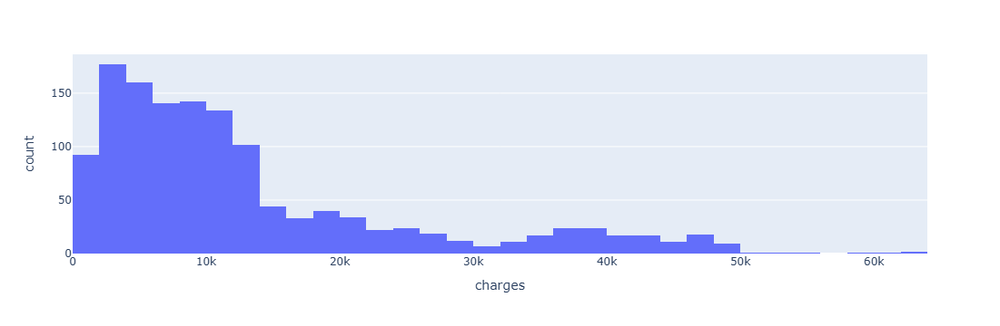

In [83]:
import plotly.express as px
px.histogram(df,'charges')

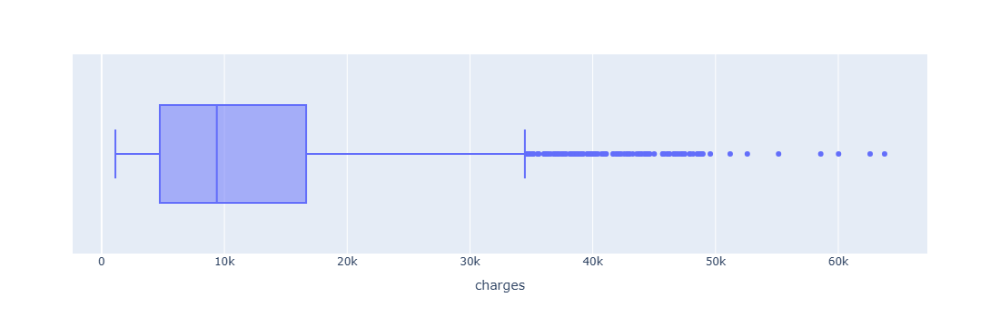

In [84]:
px.box(df,'charges')

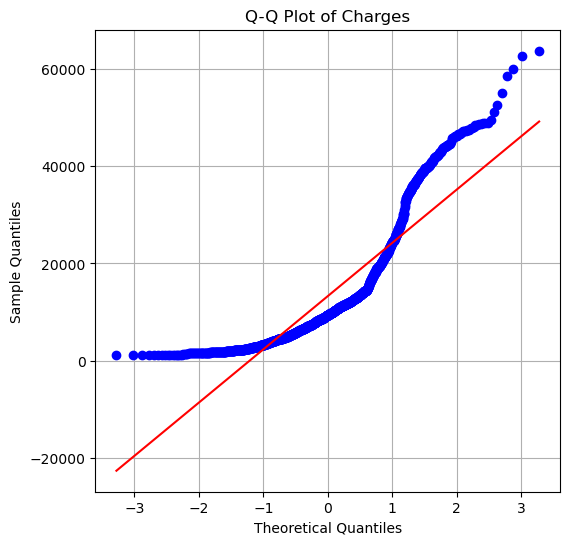

In [85]:
# 2. Q-Q Plot using Matplotlib (scipy is used for quantiles)
import scipy.stats as stats
plt.figure(figsize=(6,6))
stats.probplot(df["charges"], dist="norm", plot=plt)
plt.title("Q-Q Plot of Charges")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.grid(True)
plt.show()

In [86]:
df.shape

(1338, 7)

In [87]:
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [88]:
df['region'].unique()

array(['southwest', 'southeast', 'northwest', 'northeast'], dtype=object)

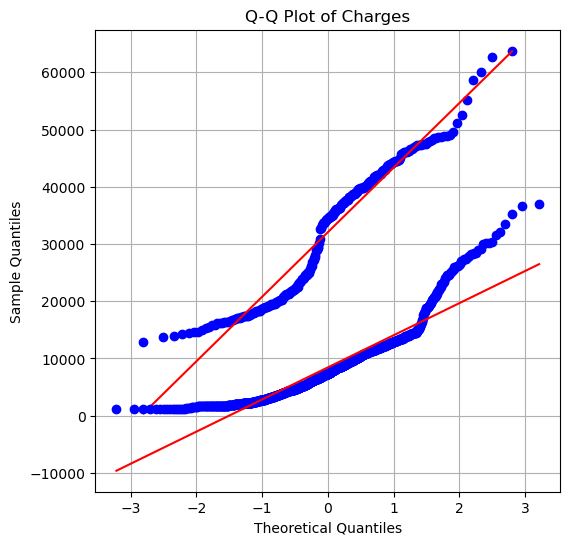

In [89]:
import scipy.stats as stats
import matplotlib.pyplot as plt # Import matplotlib

plt.figure(figsize=(6,6))
smoker = df[df['smoker'] == 'yes']
non_smoker = df[df['smoker'] == 'no']
stats.probplot(smoker['charges'], dist="norm", plot=plt) # Select 'charges' column
stats.probplot(non_smoker['charges'], dist="norm", plot=plt) # Select 'charges' column
plt.title("Q-Q Plot of Charges")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.grid(True)
plt.show()

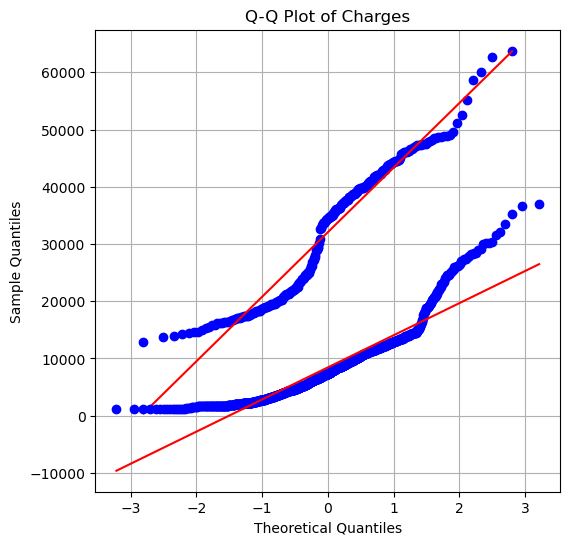

In [90]:
import scipy.stats as stats
import matplotlib.pyplot as plt # Import matplotlib

plt.figure(figsize=(6,6))
smoker = df[df['smoker'] == 'yes']
non_smoker = df[df['smoker'] == 'no']
stats.probplot(smoker['charges'], dist="norm", plot=plt) # Select 'charges' column
stats.probplot(non_smoker['charges'], dist="norm", plot=plt) # Select 'charges' column
plt.title("Q-Q Plot of Charges")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.grid(True)
plt.show()

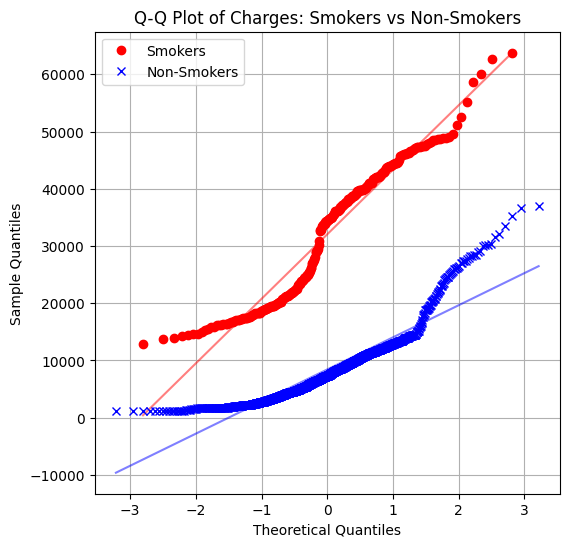

In [31]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Prepare data
smoker = df[df['smoker'] == 'yes']['charges']
non_smoker = df[df['smoker'] == 'no']['charges']

# Generate Q-Q data
smoker_qq = stats.probplot(smoker, dist="norm")
non_smoker_qq = stats.probplot(non_smoker, dist="norm")

# Create plot
plt.figure(figsize=(6,6))

# Plot smokers' Q-Q plot and line
plt.plot(smoker_qq[0][0], smoker_qq[0][1], 'o', label='Smokers', color='red')
smoker_line = smoker_qq[1][1] + smoker_qq[1][0] * smoker_qq[0][0]
plt.plot(smoker_qq[0][0], smoker_line, 'r-', alpha=0.5)

# Plot non-smokers' Q-Q plot and line
plt.plot(non_smoker_qq[0][0], non_smoker_qq[0][1], 'x', label='Non-Smokers', color='blue')
non_smoker_line = non_smoker_qq[1][1] + non_smoker_qq[1][0] * non_smoker_qq[0][0]
plt.plot(non_smoker_qq[0][0], non_smoker_line, 'b-', alpha=0.5)

# Plot formatting
plt.title("Q-Q Plot of Charges: Smokers vs Non-Smokers")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.grid(True)
plt.legend()
plt.show()


In [93]:
df = pd.read_csv("data/Mall_Customers.csv")
df.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


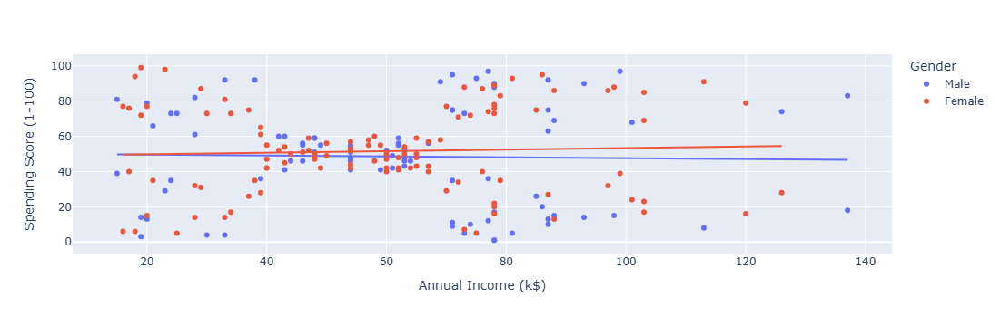

In [94]:
px.scatter(df,'Annual Income (k$)','Spending Score (1-100)',color='Gender',trendline='ols')

Hypothsis Testing

In [95]:
# 1 tailed t test
from scipy import stats

# Sample delivery times (in minutes)
delivery_times = [32, 35, 30, 31, 36, 33, 29, 34, 37, 28]

# Population mean to test against
mu_0 = 30

# One-sample t-test (one-tailed test: greater than 30)
t_stat, p_value_two_tailed = stats.ttest_1samp(delivery_times, mu_0)

# For one-tailed test (greater than), divide p-value by 2
p_value_one_tailed = p_value_two_tailed / 2

# Output results
print("Sample Mean:", round(sum(delivery_times) / len(delivery_times), 2))
print("t-statistic:", round(t_stat, 3))
print("p-value (one-tailed):", round(p_value_one_tailed, 4))

# Conclusion
alpha = 0.05
if p_value_one_tailed < alpha and t_stat > 0:
    print("Conclusion: Reject H0 — average delivery time is greater than 30 minutes.")
else:
    print("Conclusion: Fail to reject H0 — not enough evidence that average is greater.")


Sample Mean: 32.5
t-statistic: 2.611
p-value (one-tailed): 0.0141
Conclusion: Reject H0 — average delivery time is greater than 30 minutes.


In [96]:
#Independent 2 tail test
from scipy import stats

# Scores from two independent groups
group_a = [75, 78, 74, 72, 80, 77, 73, 76, 79, 74]  # Traditional
group_b = [82, 85, 84, 81, 86, 83, 80, 87, 85, 84]  # Interactive

# Perform two-sample t-test (equal variances assumed)
t_stat, p_value = stats.ttest_ind(group_a, group_b, equal_var=True)

# Output results
print("Group A Mean:", round(sum(group_a)/len(group_a), 2))
print("Group B Mean:", round(sum(group_b)/len(group_b), 2))
print("t-statistic:", round(t_stat, 3))
print("p-value:", round(p_value, 4))

# Interpret result
alpha = 0.05
if p_value < alpha:
    print("Conclusion: Reject H0 — There is a significant difference between the teaching methods.")
else:
    print("Conclusion: Fail to reject H0 — No significant difference detected.")


Group A Mean: 75.8
Group B Mean: 83.7
t-statistic: -7.222
p-value: 0.0
Conclusion: Reject H0 — There is a significant difference between the teaching methods.


In [97]:
#Anova

from scipy import stats

# Step 1: Create test scores for each group
group_a = [70, 72, 68, 75, 74]  # Traditional
group_b = [80, 82, 85, 79, 81]  # Online
group_c = [90, 88, 92, 91, 89]  # Workshop

# Step 2: Perform one-way ANOVA test
f_stat, p_value = stats.f_oneway(group_a, group_b, group_c)

# Step 3: Print the result
print("F-statistic:", round(f_stat, 2))
print("p-value:", round(p_value, 4))

# Step 4: Interpret the result
alpha = 0.05
if p_value < alpha:
    print("Conclusion: Reject H0 — At least one group is different.")
else:
    print("Conclusion: Fail to reject H0 — No significant difference between groups.")

F-statistic: 77.71
p-value: 0.0
Conclusion: Reject H0 — At least one group is different.


In [100]:
#Chi Square
import numpy as np
from scipy.stats import chi2_contingency

# Observed frequency table (2x2)
# Rows = Gender (Male, Female)
# Columns = Purchase (Yes, No)

observed = np.array([
    [30, 20],  # Male: 30 Yes, 20 No
    [10, 40]   # Female: 10 Yes, 40 No
])

In [ ]:
# Shapiro-Wilk test on df

In [101]:
from scipy.stats import shapiro

# Perform the Shapiro-Wilk test on the 'charges' column
shapiro_test_statistic, shapiro_p_value = shapiro(df['charges'])

# Output the results
print(f"Shapiro-Wilk Test Statistic: {shapiro_test_statistic:.4f}")
print(f"Shapiro-Wilk P-value: {shapiro_p_value:.4f}")

# Interpret the result
alpha = 0.05
if shapiro_p_value < alpha:
    print("Conclusion: Reject H0 - The 'charges' data does not appear to be normally distributed.")
else:
    print("Conclusion: Fail to reject H0 - The 'charges' data appears to be normally distributed.")

KeyError: 'charges'

 3. One-tail t-test Question

Dataset: [Students Performance in Exams (same as above)](https://www.kaggle.com/datasets/spscientist/students-performance-in-exams)

Problem:
Test the hypothesis that mean math score is greater than 65 (use one-sample, one-tail t-test).

Steps for Students:

 Null hypothesis: mean ≤ 65
 Alternative hypothesis: mean > 65
 Conduct one-sample t-test
 Report t-statistic and p-value; conclude



In [103]:
import pandas as pd
df = pd.read_csv("data/StudentsPerformance.csv")
df.head()


,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


In [104]:
# Null hypothesis: mean ≤ 65 Alternative hypothesis: mean > 65 Conduct one-sample t-test Report t-statistic and p-value; conclude
from scipy import stats
t_stat, p_value_two_tailed = stats.ttest_1samp(df['math score'], 65)
p_value_one_tailed = p_value_two_tailed / 2
print("Sample Mean:", round(sum(df['math score']) / len(df['math score']), 2))
print("t-statistic:", round(t_stat, 3))
print("p-value (one-tailed):", round(p_value_one_tailed, 4))
alpha = 0.05
if p_value_one_tailed < alpha and t_stat > 0:
    print("Conclusion: Reject H0 — average math score is greater than 65.")
else:
    print("Conclusion: Fail to reject H0 — not enough evidence that average is greater.")

Sample Mean: 66.09
t-statistic: 2.271
p-value (one-tailed): 0.0117
Conclusion: Reject H0 — average math score is greater than 65.


 4. Two-tail t-test Question

Dataset: [Students Performance in Exams (same as above)](https://www.kaggle.com/datasets/spscientist/students-performance-in-exams)

Problem:
Test if average math score differs between male and female students (two-sample, two-tail t-test).

Steps for Students:

 Null hypothesis: means are equal
 Alternative hypothesis: means are different
 Perform independent two-sample t-test
 Report t-statistic and p-value; conclude



In [105]:
#Null hypothesis: means are equal Alternative hypothesis: means are different Perform independent two-sample t-test Report t-statistic and p-value; conclude
t_stat, p_value = stats.ttest_ind(df[df['gender'] == 'male']['math score'], df[df['gender'] == 'female']['math score'], equal_var=True)
print("t-statistic:", round(t_stat, 3))
print("p-value:", round(p_value, 4))
alpha = 0.05
if p_value < alpha:
    print("Conclusion: Reject H0 — There is a significant difference between the average math scores of male and female students.")
else:
    print("Conclusion: Fail to reject H0 — No significant difference detected.")

t-statistic: 5.383
p-value: 0.0
Conclusion: Reject H0 — There is a significant difference between the average math scores of male and female students.


In [106]:
df = pd.read_csv('data/ds_salaries.csv')
df.head()

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L


#does size of the company affects the salary

**Hypothesis Test: Salary vs. Company Size**

*   **Null Hypothesis (H0):** The mean salary is the same across different company sizes.
*   **Alternative Hypothesis (H1):** The mean salary is different for at least one company size.

In [107]:
from scipy import stats

# Separate salaries by company size
salary_s = df[df['company_size'] == 'S']['salary_in_usd']
salary_m = df[df['company_size'] == 'M']['salary_in_usd']
salary_l = df[df['company_size'] == 'L']['salary_in_usd']

# Perform one-way ANOVA test
f_stat, p_value = stats.f_oneway(salary_s, salary_m, salary_l)

# Output results
print(f"F-statistic: {f_stat:.4f}")
print(f"p-value: {p_value:.4f}")

# Interpret the result
alpha = 0.05
if p_value < alpha:
    print("Conclusion: Reject H0 - There is a significant difference in average salary for at least one company size.")
else:
    print("Conclusion: Fail to reject H0 - No significant difference in average salary detected across company sizes.")

F-statistic: 11.9578
p-value: 0.0000
Conclusion: Reject H0 - There is a significant difference in average salary for at least one company size.


In [108]:
df1 = pd.read_csv('data/tmdb_5000_movies.csv')
df1.head()

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124


In [109]:
import json

# Function to extract genre names
def get_genres(genre_list):
    if isinstance(genre_list, str):
        genres = json.loads(genre_list)
        return [g['name'] for g in genres]
    return []

# Apply the function to create a list of genre names for each movie
df1['genre_names'] = df1['genres'].apply(get_genres)

# Create a new dataframe with one row per genre for each movie
df_genres = df1.explode('genre_names')

# Group by genre and calculate the mean revenue
genre_revenue = df_genres.groupby('genre_names')['revenue'].mean().sort_values(ascending=False)

# Convert revenue to millions
genre_revenue_in_millions = genre_revenue / 1_000_000

# Display the result in millions
print("Average Revenue by Genre (in millions):")
print(genre_revenue_in_millions)

Average Revenue by Genre (in millions):
genre_names
Animation          225.693025
Adventure          208.660204
Fantasy            193.354245
Family             162.345495
Science Fiction    152.456515
Action             141.213098
War                 84.155874
Thriller            81.044291
Mystery             78.300927
Comedy              71.289499
Crime               66.150662
Romance             60.002391
History             57.523562
Drama               52.116232
Music               48.455952
Western             46.245965
Horror              43.545076
Documentary          9.838888
Foreign              0.364652
TV Movie             0.000000
Name: revenue, dtype: float64


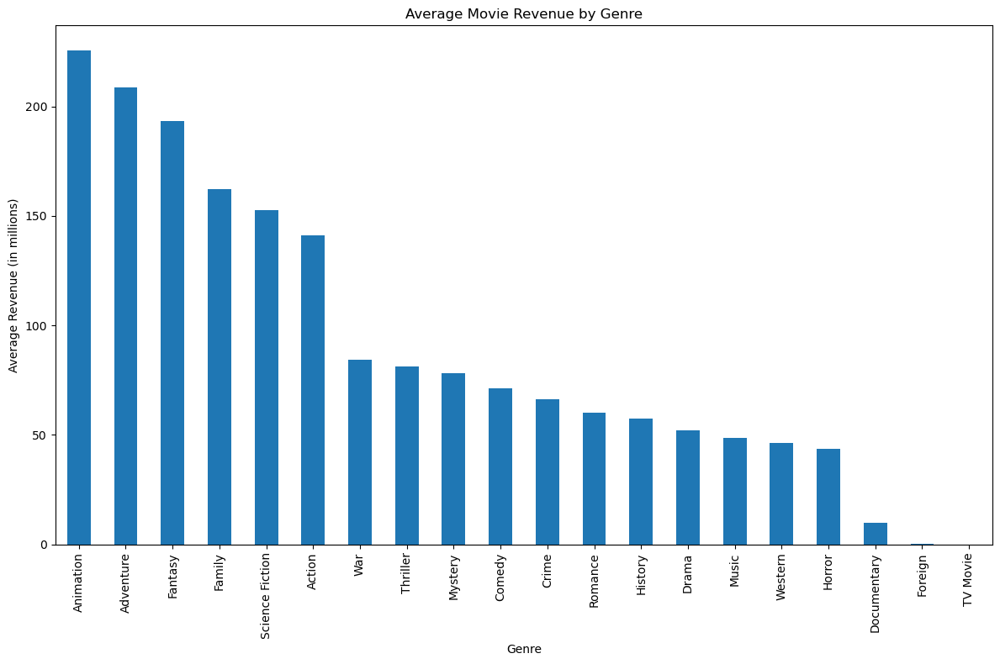

In [110]:
import matplotlib.pyplot as plt

# Create a bar chart
plt.figure(figsize=(12, 8))
genre_revenue_in_millions.plot(kind='bar')

# Add labels and title
plt.xlabel("Genre")
plt.ylabel("Average Revenue (in millions)")
plt.title("Average Movie Revenue by Genre")
plt.xticks(rotation=90) # Rotate x-axis labels for better readability

# Show the plot
plt.tight_layout()
plt.show()

**Hypothesis Test: Revenue vs. Genre**

*   **Null Hypothesis (H0):** The mean revenue is the same across all movie genres.
*   **Alternative Hypothesis (H1):** The mean revenue is different for at least one movie genre.

In [111]:
from scipy import stats

# Prepare data for ANOVA - create a list of revenue arrays for each genre
# We'll use the df_genres dataframe created earlier which has one row per genre per movie
genre_groups = [df_genres[df_genres['genre_names'] == genre]['revenue'].dropna() for genre in df_genres['genre_names'].unique()]

# Remove any empty arrays that might result from genres with no revenue data
genre_groups = [group for group in genre_groups if not group.empty]

# Perform one-way ANOVA test
f_stat, p_value = stats.f_oneway(*genre_groups)

# Output results
print(f"F-statistic: {f_stat:.4f}")
print(f"p-value: {p_value:.4f}")

# Interpret the result
alpha = 0.05
if p_value < alpha:
    print("Conclusion: Reject H0 - There is a significant difference in average revenue for at least one genre.")
else:
    print("Conclusion: Fail to reject H0 - No significant difference in average revenue detected across genres.")

F-statistic: 63.7100
p-value: 0.0000
Conclusion: Reject H0 - There is a significant difference in average revenue for at least one genre.


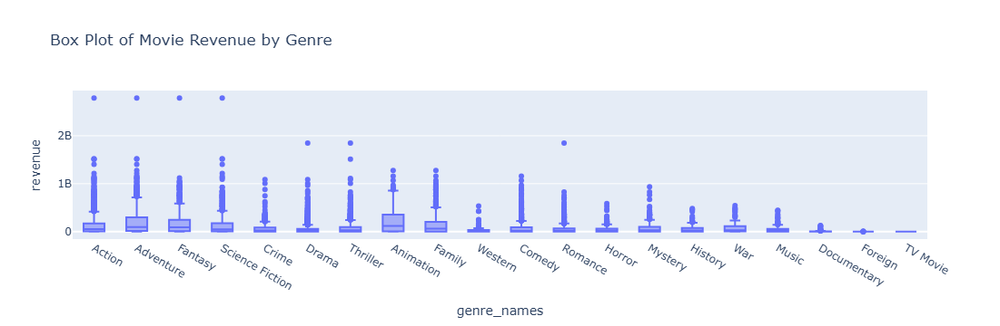

In [112]:
import plotly.express as px

# Use the df_genres dataframe which has been exploded by genre
fig = px.box(df_genres, x='genre_names', y='revenue', title='Box Plot of Movie Revenue by Genre')
fig.show()

In [113]:
# Calculate the number of genres for each movie
df1['num_genres'] = df1['genre_names'].apply(len)

# Display the distribution of the number of genres
print("Distribution of the number of genres per movie:")
print(df1['num_genres'].value_counts().sort_index())

# Display the average number of genres per movie
average_genres = df1['num_genres'].mean()
print(f"\nAverage number of genres per movie: {average_genres:.2f}")

Distribution of the number of genres per movie:
num_genres
0      28
1     900
2    1490
3    1525
4     636
5     187
6      33
7       4
Name: count, dtype: int64

Average number of genres per movie: 2.53


In [114]:
# Get the value counts of the 'genre_names' list
genre_combination_counts = df1['genre_names'].value_counts()

# Display the top 10 genre combinations
print("Top 10 Genre Combinations:")
print(genre_combination_counts)

Top 10 Genre Combinations:
genre_names
[Drama]                                         370
[Comedy]                                        282
[Drama, Romance]                                164
[Comedy, Romance]                               144
[Comedy, Drama]                                 142
                                               ... 
[Adventure, Action, Comedy, Romance]              1
[Action, Fantasy, Science Fiction, Thriller]      1
[Science Fiction, Comedy, Adventure]              1
[Drama, Thriller, Horror]                         1
[Comedy, Drama, Romance, TV Movie]                1
Name: count, Length: 1175, dtype: int64


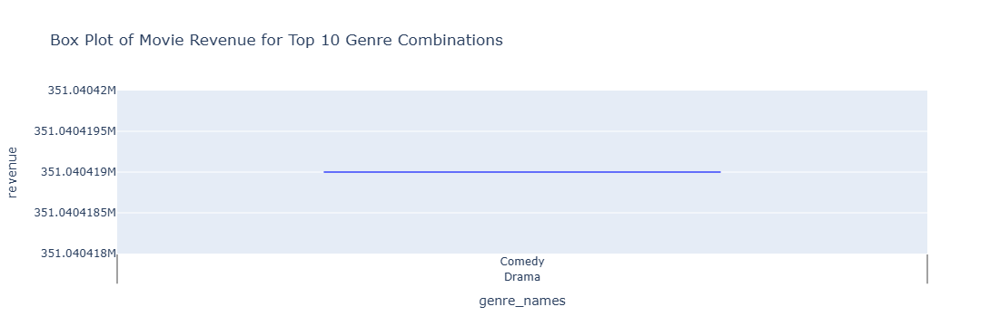

In [115]:
import plotly.express as px

# Get the top 10 genre combinations (assuming genre_combination_counts is already calculated)
top_10_genre_combinations = genre_combination_counts.head(10).index.tolist()

# Filter the dataframe to include only movies with one of the top 10 genre combinations
df_top_genres = df1[df1['genre_names'].apply(lambda x: x in top_10_genre_combinations)]

# Create a box plot for the filtered data
fig = px.box(df_top_genres, x='genre_names', y='revenue', title='Box Plot of Movie Revenue for Top 10 Genre Combinations')
fig.show()

In [116]:
# Create a new column with genre names joined by a space
df1['genre_string'] = df1['genre_names'].apply(lambda x: ' '.join(x))

# Display the head of the dataframe to show the new column
display(df1.head())

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,...,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,genre_names,num_genres,genre_string
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...",...,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800,"[Action, Adventure, Fantasy, Science Fiction]",4,Action Adventure Fantasy Science Fiction
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...",...,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,"[Adventure, Fantasy, Action]",3,Adventure Fantasy Action
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...",...,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466,"[Action, Adventure, Crime]",3,Action Adventure Crime
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...",...,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106,"[Action, Crime, Drama, Thriller]",4,Action Crime Drama Thriller
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]",...,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124,"[Action, Adventure, Science Fiction]",3,Action Adventure Science Fiction


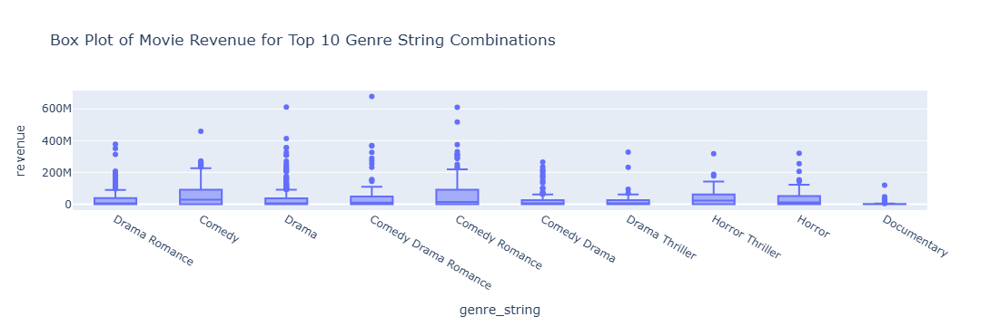

In [117]:
import plotly.express as px

# Get the top 10 most frequent genre strings
top_10_genre_strings = df1['genre_string'].value_counts().head(10).index.tolist()

# Filter the dataframe to include only movies with one of the top 10 genre strings
df_top_genre_strings = df1[df1['genre_string'].isin(top_10_genre_strings)]

# Create a box plot for the filtered data
fig = px.box(df_top_genre_strings, x='genre_string', y='revenue', title='Box Plot of Movie Revenue for Top 10 Genre String Combinations')
fig.show()